# Classification of Pet's Faces

Lab Assignment from [AI for Beginners Curriculum](https://github.com/microsoft/ai-for-beginners).

### Getting the Data

In this assignment, we will focus on relatively simple classification task - classification of pet's faces. This dataset consists of cut-out faces from [Oxford-IIIT Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/). Let's start by loading and visualizing the dataset.

In [1]:
import wget
import rm

#url = 'https://mslearntensorflowlp.blob.core.windows.net/data/petfaces.tar.gz'
#downloaded_file = wget.download(url)
#print(dowloaded_file)
!wget https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz
!tar xfz images.tar.gz
!rm images.tar.gz

'wget' is not recognized as an internal or external command,
operable program or batch file.
tar: Error opening archive: Failed to open 'images.tar.gz'
'rm' is not recognized as an internal or external command,
operable program or batch file.


We will define generic function to display a series of images from a list:

In [2]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow import keras
from pathlib import Path
import cv2
from tfcv import *

def display_images(l,titles=None,fontsize=12):
    n=len(l)
    fig,ax = plt.subplots(1,n)
    for i,im in enumerate(l):
        ax[i].imshow(im)
        ax[i].axis('off')
        if titles is not None:
            ax[i].set_title(titles[i],fontsize=fontsize)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()

sys_details = tf.sysconfig.get_build_info()
print(sys_details)

OrderedDict({'is_cuda_build': False, 'is_rocm_build': False, 'is_tensorrt_build': False, 'msvcp_dll_names': 'msvcp140.dll,msvcp140_1.dll'})


Now let's traverse all class subdirectories and plot first few images of each class:

Cat


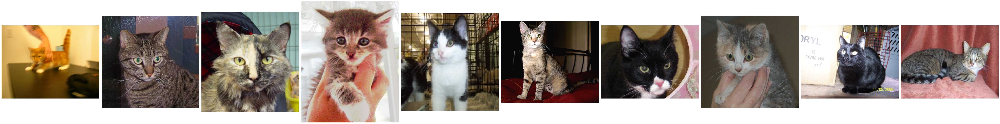

Dog


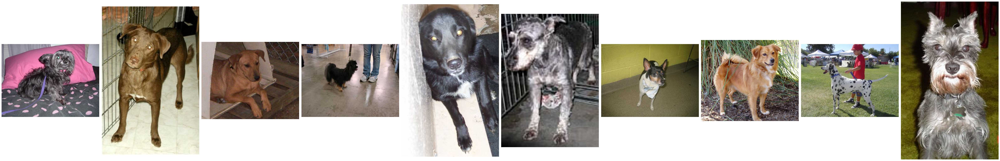

In [3]:
for cls in os.listdir('PetImages'):
    print(cls)
    display_images([Image.open(os.path.join('PetImages',cls,x)) 
                    for x in os.listdir(os.path.join('PetImages',cls))[:10]])

Let's also define the number of classes in our dataset:

In [3]:
num_classes = len(os.listdir('PetImages'))
num_classes

2

## Preparing dataset for Deep Learning

To start training our neural network, we need to convert all images to tensors, and also create tensors corresponding to labels (class numbers). Most neural network frameworks contain simple tools for dealing with images:
* In Tensorflow, use `tf.keras.preprocessing.image_dataset_from_directory`
* In PyTorch, use `torchvision.datasets.ImageFolder`

As you have seen from the pictures above, all of them are close to square image ratio, so we need to resize all images to square size. Also, we can organize images in minibatches.

**Data processing because my files are corrupted apparently**

In [4]:
num_skipped = 0
for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join("PetImages", folder_name)
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)
        try:
            fobj = open(fpath, "rb")
            is_jfif = b"JFIF" in fobj.peek(10)
        finally:
            fobj.close()

        if not is_jfif:
            num_skipped += 1
            # Delete corrupted image
            os.remove(fpath)

print(f"Deleted {num_skipped} images.")

Deleted 0 images.


**Before restarting the kernel and rerunning the cells, there were ~1500 corrupt images removed**

In [4]:
batch_size = 32
img_height = 128
img_width = 128
dataset = tf.keras.preprocessing.image_dataset_from_directory('PetImages', labels = 'inferred', class_names = ['Cat','Dog'], validation_split = 0.2, subset = "training", shuffle = True, seed = 1337, 
            image_size = (img_height,img_width), batch_size = 32)
val_dataset = tf.keras.preprocessing.image_dataset_from_directory('PetImages', labels = 'inferred', class_names = ['Cat','Dog'], validation_split = 0.2, subset = "validation", shuffle = True, seed = 1337, 
            image_size = (img_height,img_width), batch_size = 32)

#(x_train,y_train),(x_test,y_test)

Found 23404 files belonging to 2 classes.
Using 18724 files for training.
Found 23404 files belonging to 2 classes.
Using 4680 files for validation.


Now we need to separate dataset into train and test portions:

In [6]:
# CODE TO DO TRAIN/TEST SPLIT

Now let's print the size of tensors in our dataset. If you have done everything correctly, the size of training elements should be
 * `(batch_size,image_size,image_size,3)` for Tensorflow, `batch_size,3,image_size,image_size` for PyTorch
 * `batch_size` for Labels
 
 Labels should contain numbers of classes.

In [7]:
# Print tensor sizes
for example in dataset:
    print(np.shape(example[0]))
    print(np.shape(example[1]))
    break

(32, 128, 128, 3)
(32,)


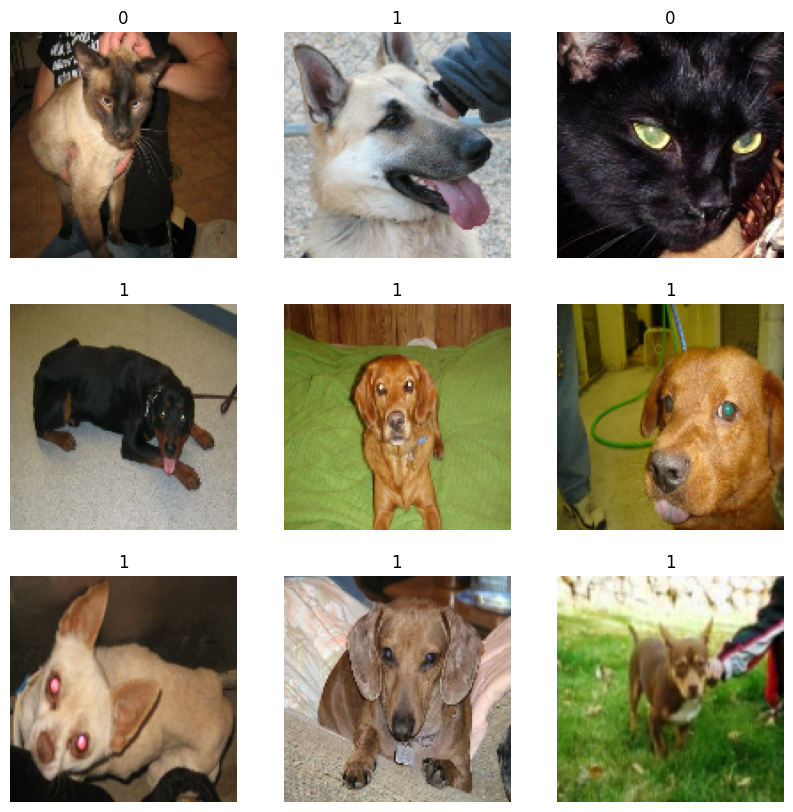

In [8]:
# Display the data
plt.figure(figsize=(10, 10))
for images, labels in dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(images[i]).astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

## Define a neural network

For image classification, you should probably define a convolutional neural network with several layers. What to keep an eye for:
* Keep in mind the pyramid architecture, i.e. number of filters should increase as you go deeper
* Do not forget activation functions between layers (ReLU) and Max Pooling
* Final classifier can be with or without hidden layers, but the number of output neurons should be equal to number of classes.

An important thing is to get the activation function on the last layer + loss function right:
* In Tensorflow, you can use `softmax` as the activation, and `sparse_categorical_crossentropy` as loss. The difference between sparse categorical cross-entropy and non-sparse one is that the former expects output as the number of class, and not as one-hot vector.
* In PyTorch, you can have the final layer without activation function, and use `CrossEntropyLoss` loss function. This function applies softmax automatically. 

In [5]:
# CODE TO DEFINE NEURAL NETWORK
model = keras.models.Sequential([
    keras.layers.Conv2D(filters = 128, kernel_size = 5, strides = 1, activation = 'relu', input_shape = (128,128,3)),
    keras.layers.MaxPooling2D(pool_size = 2, strides = 2),
    keras.layers.Conv2D(filters = 30, kernel_size = 5, strides = 1, activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = 2, strides = 2),
    keras.layers.Flatten(),
    keras.layers.Dense(120, activation = 'relu'),
    keras.layers.Dense(84, activation = 'relu'),
    keras.layers.Dense(2, activation = 'softmax')])

model.summary()

C:\Users\ocarn\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 124, 124, 128)       │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 62, 62, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 58, 58, 30)          │          96,030 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 29, 29, 30)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25230)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │       3,027,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 84)                  │          10,164 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 2)                   │             170 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,143,812 (11.99 MB)

 Trainable params: 3,143,812 (11.99 MB)

 Non-trainable params: 0 (0.00 B)

## Train the Neural Network

Now we are ready to train the neural network. During training, please collect accuracy on train and test data on each epoch, and then plot the accuracy to see if there is overfitting.

> To speed up training, you need to use GPU if available. While TensorFlow/Keras will automatically use GPU, in PyTorch you need to move both the model and data to GPU during training using `.to()` method in order to take advantage of GPU acceleration. 


In [7]:
# TRAIN THE NETWORK
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
hist = model.fit(dataset,validation_data=(val_dataset),epochs=10)

Epoch 1/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 90s 153ms/step - acc: 0.4999 - loss: 0.6943 - val_acc: 0.5038 - val_loss: 0.6931
Epoch 2/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 89s 151ms/step - acc: 0.5074 - loss: 0.6934 - val_acc: 0.4962 - val_loss: 0.6932
Epoch 3/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 90s 153ms/step - acc: 0.5030 - loss: 0.6935 - val_acc: 0.5041 - val_loss: 0.6931
Epoch 4/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 88s 151ms/step - acc: 0.5079 - loss: 0.6932 - val_acc: 0.5038 - val_loss: 0.6931
Epoch 5/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 87s 149ms/step - acc: 0.5050 - loss: 0.6932 - val_acc: 0.4962 - val_loss: 0.6932
Epoch 6/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 88s 150ms/step - acc: 0.5044 - loss: 0.6932 - val_acc: 0.5038 - val_loss: 0.6931
Epoch 7/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 87s 149ms/step - acc: 0.5054 - loss: 0.6932 - val_acc: 0.4962 - val_loss: 0.6932
Epoch 8/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 86s 147ms/step - acc: 0.4999 - loss: 0.6932 - val_acc: 0.4962 - val_loss: 0.6932
Epoch 9/10
586/586 ━━━━━━━━━━━━━

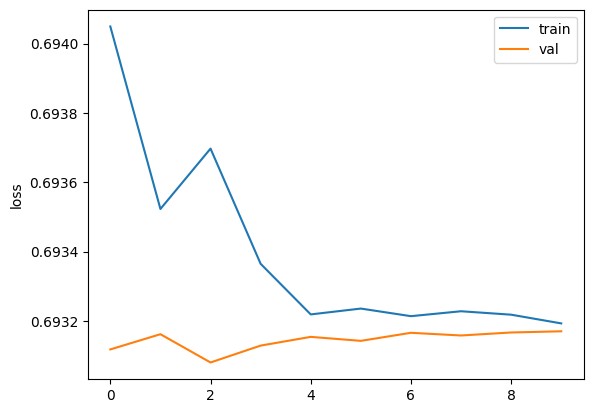

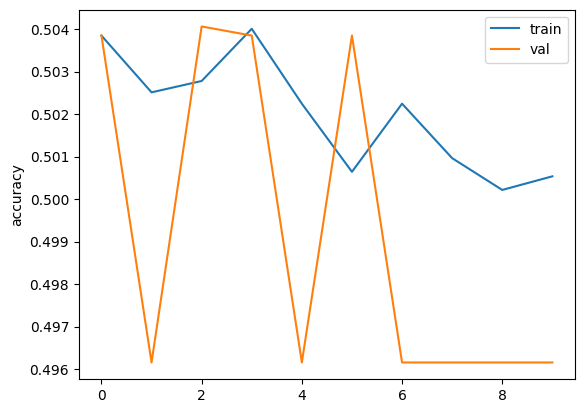

In [16]:
# PLOT THE ACCURACY on train and validation dataset
plt.plot(hist.history['loss'], label = 'train')
plt.plot(hist.history['val_loss'], label = 'val')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(hist.history['acc'], label = 'train')
plt.plot(hist.history['val_acc'], label = 'val')
plt.ylabel('accuracy')
plt.legend()
plt.show()

**I will deviate from the lab and create my own model away from the given lecture to try something called data augmentation**

In [17]:
model = keras.models.Sequential([

    keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (128,128,3)),
    keras.layers.Rescaling(1./255),
    keras.layers.RandomFlip("horizontal_and_vertical"),
    keras.layers.RandomRotation(0.1),
    
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size = (2,2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size = (2,2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size = (2,2)),
    keras.layers.Dropout(0.25),

    keras.layers.Flatten(),
    keras.layers.Dense(512, activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense (2,activation = 'softmax')
])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 512)                 │      12,845,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 12,942,786 (49.37 MB)

 Trainable params: 12,941,314 (49.37 MB)

 Non-trainable params: 1,472 (5.75 KB)

In [18]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
hist = model.fit(dataset,validation_data=(val_dataset),epochs=10)

Epoch 1/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 123s 207ms/step - acc: 0.5936 - loss: 0.9579 - val_acc: 0.6453 - val_loss: 0.6355
Epoch 2/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 120s 205ms/step - acc: 0.6760 - loss: 0.6077 - val_acc: 0.7006 - val_loss: 0.6052
Epoch 3/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 120s 205ms/step - acc: 0.7141 - loss: 0.5599 - val_acc: 0.5137 - val_loss: 1.6627
Epoch 4/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 120s 206ms/step - acc: 0.7064 - loss: 0.5588 - val_acc: 0.6994 - val_loss: 0.5953
Epoch 5/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 120s 205ms/step - acc: 0.7442 - loss: 0.5121 - val_acc: 0.7491 - val_loss: 0.5140
Epoch 6/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 119s 203ms/step - acc: 0.7691 - loss: 0.4863 - val_acc: 0.5543 - val_loss: 1.9531
Epoch 7/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 118s 201ms/step - acc: 0.7820 - loss: 0.4582 - val_acc: 0.7756 - val_loss: 0.5165
Epoch 8/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 119s 202ms/step - acc: 0.8045 - loss: 0.4303 - val_acc: 0.7538 - val_loss: 0.5664
Epoch 9/10
586/586 ━━━━━

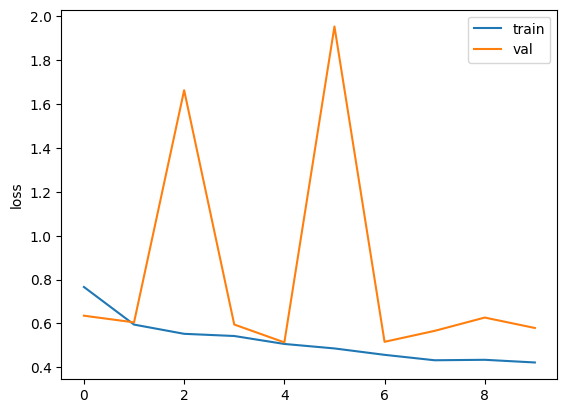

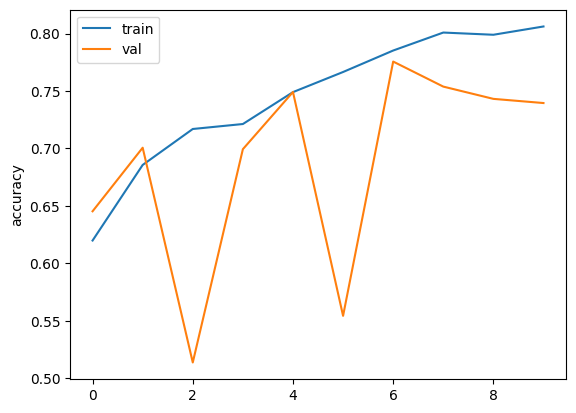

In [19]:
plt.plot(hist.history['loss'], label = 'train')
plt.plot(hist.history['val_loss'], label = 'val')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(hist.history['acc'], label = 'train')
plt.plot(hist.history['val_acc'], label = 'val')
plt.ylabel('accuracy')
plt.legend()
plt.show()

What can you say about overfitting? What can be done to improve the accuracy of the model

## Optional: Calculate Top3 Accuracy

In this exercise, we were dealing with classification with quite high number of classes (35), so our result - around 50% validation accuracy - is pretty good. Standard ImageNet dataset has even more - 1000 classes.

In such cases it is difficult to ensure that model **always** correctly predicts the class. There are cases when two breeds are very similar to each other, and the model returns very similar probablities (eg., 0.45 and 0.43). If we measure standard accuracy, it will be considered a wrong case, even though the model did very small mistake. This, we often measure another metric - an accuracy within top 3 most probable predictions of the model.

We consider the case accurate if target label is contained within top 3 model predictions. 

To compute top-3 accuracy on the test dataset, you need to manually go over the dataset, apply the neural network to get the prediction, and then do the calculations. Some hints:

* In Tensorflow, use `tf.nn.in_top_k` function to see if the `predictions` (output of the model) are in top-k (pass `k=3` as parameter), with respect to `targets`. This function returns a tensor of boolean values, which can be converted to `int` using `tf.cast`, and then accumulated using `tf.reduce_sum`.
* In PyTorch, you can use `torch.topk` function to get indices of classes with highers probabilities, and then see if the correct class belongs to them. See [this](https://gist.github.com/weiaicunzai/2a5ae6eac6712c70bde0630f3e76b77b) for more hints.


In [42]:
# CALCULATE TOP-3 ACCURACY
x_test = list(map(lambda x: x[0], dataset)) #use this function to separate Dataset objects into features and label components
#y_test = list(map(lambda x: x[1], dataset))
#print(x_test[0][:2])
prediction = model.predict(x_test[0][:2])
target = tf.constant([0,1])
tf.nn.in_top_k(target, prediction,3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


<tf.Tensor: shape=(2,), dtype=bool, numpy=array([ True,  True])>

## Optional: Build Cats vs. Dogs classification

We also want to see how accurate our binary cats vs. dogs classification would be on the same dateset. To do it, we need to adjust labels:

In [48]:
# Define dataset that contains only two labels: 0 = cat, 1 = dog
# Hint: use class name prefix to figure out which one is which
batch_size = 32
img_height = 128
img_width = 128
dataset = tf.keras.preprocessing.image_dataset_from_directory('PetImages', labels = 'inferred', label_mode = "binary", validation_split = 0.2, subset = "training", shuffle = True, seed = 1337, 
            image_size = (img_height,img_width), batch_size = 32)
val_dataset = tf.keras.preprocessing.image_dataset_from_directory('PetImages', labels = 'inferred', label_mode = "binary", validation_split = 0.2, subset = "validation", shuffle = True, seed = 1337, 
            image_size = (img_height,img_width), batch_size = 32)

x_train = list(map(lambda x: x[0], dataset))
y_train = list(map(lambda x: x[1], dataset))

x_test = list(map(lambda x: x[0], val_dataset))
y_test = list(map(lambda x: x[1], val_dataset))


Found 23404 files belonging to 2 classes.
Using 18724 files for training.
Found 23404 files belonging to 2 classes.
Using 4680 files for validation.


In [49]:
# Define neural network architecture and train
model = keras.models.Sequential([
    keras.layers.Conv2D(filters = 128, kernel_size = 5, strides = 1, activation = 'relu', input_shape = (128,128,3)),
    keras.layers.MaxPooling2D(pool_size = 2, strides = 2),
    keras.layers.Conv2D(filters = 30, kernel_size = 5, strides = 1, activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = 2, strides = 2),
    keras.layers.Flatten(),
    keras.layers.Dense(120, activation = 'relu'),
    keras.layers.Dense(84, activation = 'relu'),
    keras.layers.Dense(2, activation = 'sigmoid')])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 124, 124, 128)       │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 62, 62, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 58, 58, 30)          │          96,030 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 29, 29, 30)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25230)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 120)                 │       3,027,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 84)                  │          10,164 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 2)                   │             170 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,143,812 (11.99 MB)

 Trainable params: 3,143,812 (11.99 MB)

 Non-trainable params: 0 (0.00 B)

In [53]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
hist = model.fit(dataset,validation_data=(val_dataset),epochs=10)

Epoch 1/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 144ms/step - acc: 0.5063 - loss: 6.1052 - val_acc: 0.4953 - val_loss: 0.6931
Epoch 2/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 84s 143ms/step - acc: 0.5076 - loss: 0.6930 - val_acc: 0.5175 - val_loss: 0.6951
Epoch 3/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 145ms/step - acc: 0.5092 - loss: 0.6943 - val_acc: 0.5051 - val_loss: 0.6935
Epoch 4/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 145ms/step - acc: 0.5114 - loss: 0.6996 - val_acc: 0.5045 - val_loss: 0.6961
Epoch 5/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 145ms/step - acc: 0.5111 - loss: 0.6911 - val_acc: 0.5041 - val_loss: 0.7002
Epoch 6/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 86s 146ms/step - acc: 0.5108 - loss: 0.6931 - val_acc: 0.5045 - val_loss: 0.7016
Epoch 7/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 145ms/step - acc: 0.5102 - loss: 0.6899 - val_acc: 0.5038 - val_loss: 0.7067
Epoch 8/10
586/586 ━━━━━━━━━━━━━━━━━━━━ 85s 145ms/step - acc: 0.5138 - loss: 0.6890 - val_acc: 0.5058 - val_loss: 0.7065
Epoch 9/10
586/586 ━━━━━━━━━━━━━

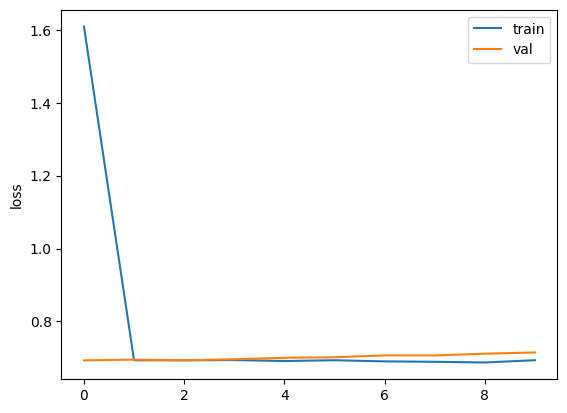

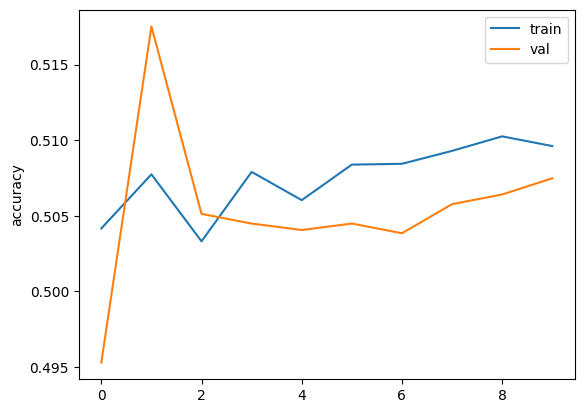

In [54]:
plt.plot(hist.history['loss'], label = 'train')
plt.plot(hist.history['val_loss'], label = 'val')
plt.ylabel('loss')
plt.legend()
plt.show()

plt.plot(hist.history['acc'], label = 'train')
plt.plot(hist.history['val_acc'], label = 'val')
plt.ylabel('accuracy')
plt.legend()
plt.show()